In [1]:
!nvidia-smi

Wed Jul 17 19:25:28 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   42C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [2]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torch.backends.cudnn as cudnn

import torchvision
import torchvision.transforms as transforms
from torchvision.models import resnet18, resnet34
import os

In [3]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
best_acc = 0  # best test accuracy
start_epoch = 0  # start from epoch 0 or last checkpoint epoch

In [4]:
# Data
transform_train = transforms.Compose([
    transforms.RandomCrop(32, padding=4),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])

transform_test = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])

trainset = torchvision.datasets.CIFAR100(
    root='./data', train=True, download=True, transform=transform_train)
trainloader = torch.utils.data.DataLoader(
    trainset, batch_size=128, shuffle=False, num_workers=2)

testset = torchvision.datasets.CIFAR100(
    root='./data', train=False, download=True, transform=transform_test)
testloader = torch.utils.data.DataLoader(
    testset, batch_size=100, shuffle=False, num_workers=2)

100%|██████████| 169001437/169001437 [00:04<00:00, 35027100.77it/s]


Extracting ./data/cifar-100-python.tar.gz to ./data
Files already downloaded and verified


In [5]:
batch = next(iter(testloader))
train_data = batch[0]

In [6]:
import numpy as np
import matplotlib.pyplot as plt

def normalize_image(image):
    image_min = image.min()
    image_max = image.max()
    image.clamp_(min = image_min, max = image_max)
    image.add_(-image_min).div_(image_max - image_min + 1e-5)
    return image

def plot_images(images, labels, classes, normalize=True):

    n_images = len(images)

    rows = int(np.sqrt(n_images))
    cols = int(np.sqrt(n_images))

    fig = plt.figure(figsize=(20, 20))

    for i in range(rows*cols):

        ax = fig.add_subplot(rows, cols, i+1)

        image = images[i]

        if normalize:
            image = normalize_image(image)

        ax.imshow(image.permute(1, 2, 0).cpu().numpy())
        ax.set_title(classes[labels[i]])
        ax.axis('off')

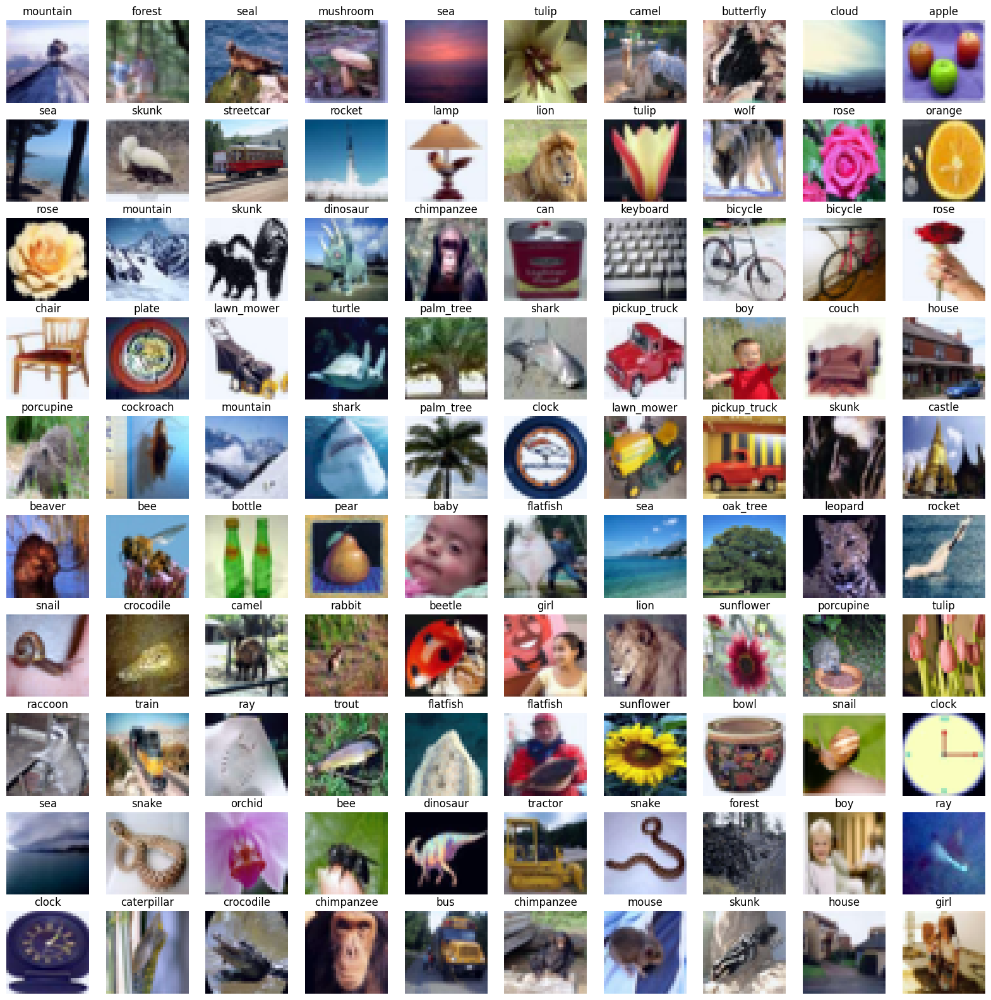

In [7]:
classes = testset.classes

plot_images(batch[0], batch[1], classes)

In [8]:
net = resnet18()
net.fc = nn.Linear(512, 100)
net = net.to(device)

In [9]:
net

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [10]:
def count_parameters(model):
    params = sum(p.numel() for p in model.parameters() if p.requires_grad)
    return params/1000000

In [13]:
print(f"num of params is {count_parameters(net)} million")

num of params is 11.227812 million


In [14]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(net.parameters(), lr=0.1,
                      momentum=0.9)#, weight_decay=5e-4)
# scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=200)

In [15]:
y = net(batch[0].to(device))

In [16]:
criterion(y, batch[1].to(device))

tensor(4.7357, device='cuda:0', grad_fn=<NllLossBackward0>)

In [19]:
FOUND_LR = 1e-3

params = [
          {'params': net.conv1.parameters(), 'lr': FOUND_LR / 10},
          {'params': net.bn1.parameters(), 'lr': FOUND_LR / 10},
          {'params': net.layer1.parameters(), 'lr': FOUND_LR / 8},
          {'params': net.layer2.parameters(), 'lr': FOUND_LR / 6},
          {'params': net.layer3.parameters(), 'lr': FOUND_LR / 4},
          {'params': net.layer4.parameters(), 'lr': FOUND_LR / 2},
          {'params': net.fc.parameters()}
         ]

optimizer = optim.Adam(params, lr = FOUND_LR)

In [20]:
from torch.utils.tensorboard import SummaryWriter
import numpy as np

In [67]:
try:
    from google import colab
    COLAB_ENV = True
except (ImportError, ModuleNotFoundError):
    COLAB_ENV = False

# Load the TensorBoard notebook extension
if COLAB_ENV:
    %load_ext tensorboard
    %tensorboard --logdir runs  --host localhost --port 8088
else:
    print("To use tensorboard, please use this notebook in a Google Colab environment.")

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [22]:
class AverageMeter(object):
    """Computes and stores the average and current value"""
    def __init__(self):
        self.reset()

    def reset(self):
        self.val = 0
        self.avg = 0
        self.sum = 0
        self.count = 0

    def update(self, val, n=1):
        self.val = val
        self.sum += val * n
        self.count += n
        self.avg = self.sum / self.count

In [23]:
!pip install torchmetrics

In [24]:
import logging
logging.getLogger().setLevel(logging.INFO)
logger = logging.getLogger('CIFAR100-ResNet')

In [25]:
logger.info('This is an info message')
logging.warning('This is a warning message')
logging.error('This is an error message')
logging.critical('This is a critical message')

INFO:CIFAR100-ResNet:This is an info message
ERROR:root:This is an error message
CRITICAL:root:This is a critical message


In [27]:
import time
time.clock_gettime(time.CLOCK_REALTIME)

1721244835.9546692

In [30]:
import datetime

# Get current time
now = datetime.datetime.now()
now

datetime.datetime(2024, 7, 17, 19, 35, 25, 285378)

In [35]:
import sys
import torchmetrics
import logging
path = f"runs/CIFAR100_{now.strftime('%Y-%m-%d_%H-%M-%S')}"
logger = logging.getLogger(path)
# writer = SummaryWriter('runs/cifar100_resnet18')
writer = SummaryWriter(path)

In [45]:
# Training
def train(epoch):
    net.train()
    loss_total = AverageMeter()
    accuracy = torchmetrics.Accuracy(task='multiclass', num_classes=100).cuda()
    for batch_idx, (inputs, targets) in enumerate(trainloader):
        inputs, targets = inputs.to(device), targets.to(device)
        optimizer.zero_grad()
        outputs = net(inputs)
        loss = criterion(outputs, targets)
        loss.backward()
        optimizer.step()
        loss_total.update(loss)
        accuracy(outputs.softmax(dim=-1), targets)
        # print(targets[:10])
        # if batch_idx == 5:
        #     break
    acc = accuracy.compute()
    writer.add_scalar('Loss/train', loss_total.avg.item(), epoch)
    writer.add_scalar('Acc/train', acc.item(), epoch)
    logger.info(f'Train: Epoch:{epoch} Loss:{loss_total.avg:.4} Accuracy:{acc:.4}')


def test(epoch, checkpoint):
    net.eval()
    loss_total = AverageMeter()
    accuracy = torchmetrics.Accuracy(task='multiclass', num_classes=100).cuda()
    with torch.no_grad():
        for batch_idx, (inputs, targets) in enumerate(testloader):
            inputs, targets = inputs.to(device), targets.to(device)
            outputs = net(inputs)
            loss = criterion(outputs, targets)
            loss_total.update(loss)
            accuracy(outputs.softmax(dim=-1), targets)
        acc = accuracy.compute()
        writer.add_scalar('Loss/test', loss_total.avg.item(), epoch)
        writer.add_scalar('Acc/test', acc.item(), epoch)
        logger.info(f'Test:  Epoch:{epoch} Loss:{loss_total.avg:.4} Accuracy:{acc:.4}')
        print()
    # Save checkpoint
    checkpoint.save(accuracy.compute(), 'ckpt', epoch=epoch)


class Checkpoint(object):
    def __init__(self):
        self.best_acc = 0.
        self.folder = 'chekpoint'
        os.makedirs(self.folder, exist_ok=True)
    def save(self, acc, filename, epoch=-1):
        if acc > best_acc:
            logger.info('Saving checkpoint...')
            state = {
                'net': net.state_dict(),
                'acc': acc,
                'epoch': epoch,
            }
            path = os.path.join(os.path.abspath(self.folder), filename + '.pth')
            torch.save(state, path)
            self.best_acc = acc
    def load(self, net):
        pass

In [46]:
checkpoint = Checkpoint()
start, end = 0, 1
for epoch in range(start, end):
    train(epoch)

writer.close()

INFO:runs/CIFAR100_2024-07-17_19-35-25:Train: Epoch:0 Loss:3.732 Accuracy:0.1293


In [51]:
checkpoint = Checkpoint()
start, end = 0, 5
# for lr in [0.1, 0.15, 0.2]:
#   for wd in [1e-4, 1e-5, 0]:
#     # net = ...
#     # optim =
for epoch in range(start, end):
    train(epoch)
    test(epoch, checkpoint)

writer.close()

INFO:runs/CIFAR100_2024-07-17_19-35-25:Train: Epoch:0 Loss:3.272 Accuracy:0.2003
INFO:runs/CIFAR100_2024-07-17_19-35-25:Test:  Epoch:0 Loss:3.047 Accuracy:0.2478
INFO:runs/CIFAR100_2024-07-17_19-35-25:Saving checkpoint...


INFO:runs/CIFAR100_2024-07-17_19-35-25:Train: Epoch:1 Loss:3.024 Accuracy:0.2466
INFO:runs/CIFAR100_2024-07-17_19-35-25:Test:  Epoch:1 Loss:2.885 Accuracy:0.2756
INFO:runs/CIFAR100_2024-07-17_19-35-25:Saving checkpoint...


INFO:runs/CIFAR100_2024-07-17_19-35-25:Train: Epoch:2 Loss:2.833 Accuracy:0.2843
INFO:runs/CIFAR100_2024-07-17_19-35-25:Test:  Epoch:2 Loss:2.71 Accuracy:0.3078
INFO:runs/CIFAR100_2024-07-17_19-35-25:Saving checkpoint...


INFO:runs/CIFAR100_2024-07-17_19-35-25:Train: Epoch:3 Loss:2.679 Accuracy:0.3128
INFO:runs/CIFAR100_2024-07-17_19-35-25:Test:  Epoch:3 Loss:2.616 Accuracy:0.326
INFO:runs/CIFAR100_2024-07-17_19-35-25:Saving checkpoint...


INFO:runs/CIFAR100_2024-07-17_19-35-25:Train: Epoch:4 Loss:2.547 Accuracy:0.3394
INFO:runs/CIFAR100_2024-07-17_19-35-25:Test:  Epoch:4 Loss:2.537 Accuracy:0.3423
INFO:runs/CIFAR100_2024-07-17_19-35-25:Saving checkpoint...


In [68]:
checkpoint = Checkpoint()
start, end = 0, 20
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(net.parameters(), lr=0.1,
                      momentum=0.9)
for epoch in range(start, end):
    train(epoch)
    test(epoch, checkpoint)

writer.close()

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
INFO:runs/CIFAR100_2024-07-17_19-35-25:Train: Epoch:0 Loss:4.084 Accuracy:0.08544
INFO:runs/CIFAR100_2024-07-17_19-35-25:Test:  Epoch:0 Loss:3.587 Accuracy:0.1352
INFO:runs/CIFAR100_2024-07-17_19-35-25:Saving checkpoint...


INFO:runs/CIFAR100_2024-07-17_19-35-25:Train: Epoch:1 Loss:3.459 Accuracy:0.1625
INFO:runs/CIFAR100_2024-07-17_19-35-25:Test:  Epoch:1 Loss:3.179 Accuracy:0.2153
INFO:runs/CIFAR100_2024-07-17_19-35-25:Saving checkpoint...


INFO:runs/CIFAR100_2024-07-17_19-35-25:Train: Epoch:2 Loss:3.148 Accuracy:0.2214
INFO:runs/CIFAR100_2024-07-17_19-35-25:Test:  Epoch:2 Loss:2.991 Accuracy:0.2623
INFO:runs/CIFAR100_2024-07-17_19-35-25:Saving checkpoint...


INFO:runs/CIFAR100_2024-07-17_19-35-25:Train: Epoch:3 Loss:2.921 Accuracy:0.2654
INFO:runs/CIFAR100_2024-07-17_19-35-25:Test:  Epoch:3 Loss:2.793 Accuracy:0.2977
INFO:runs/CIFAR100_2024-07-17_19-35-25:Saving checkpoint...


INFO:runs/CIFAR100_2024-07-17_19-35-25:Train: Epoch:4 Loss:2.713 Accuracy:0.3039
INFO:runs/CIFAR100_2024-07-17_19-35-25:Test:  Epoch:4 Loss:4.274 Accuracy:0.2519
INFO:runs/CIFAR100_2024-07-17_19-35-25:Saving checkpoint...


INFO:runs/CIFAR100_2024-07-17_19-35-25:Train: Epoch:5 Loss:2.565 Accuracy:0.3331
INFO:runs/CIFAR100_2024-07-17_19-35-25:Test:  Epoch:5 Loss:2.607 Accuracy:0.3475
INFO:runs/CIFAR100_2024-07-17_19-35-25:Saving checkpoint...


INFO:runs/CIFAR100_2024-07-17_19-35-25:Train: Epoch:6 Loss:2.418 Accuracy:0.3666
INFO:runs/CIFAR100_2024-07-17_19-35-25:Test:  Epoch:6 Loss:2.491 Accuracy:0.3635
INFO:runs/CIFAR100_2024-07-17_19-35-25:Saving checkpoint...


INFO:runs/CIFAR100_2024-07-17_19-35-25:Train: Epoch:7 Loss:2.299 Accuracy:0.392
INFO:runs/CIFAR100_2024-07-17_19-35-25:Test:  Epoch:7 Loss:2.448 Accuracy:0.3762
INFO:runs/CIFAR100_2024-07-17_19-35-25:Saving checkpoint...


INFO:runs/CIFAR100_2024-07-17_19-35-25:Train: Epoch:8 Loss:2.197 Accuracy:0.4139
INFO:runs/CIFAR100_2024-07-17_19-35-25:Test:  Epoch:8 Loss:2.353 Accuracy:0.3949
INFO:runs/CIFAR100_2024-07-17_19-35-25:Saving checkpoint...


INFO:runs/CIFAR100_2024-07-17_19-35-25:Train: Epoch:9 Loss:2.1 Accuracy:0.4328
INFO:runs/CIFAR100_2024-07-17_19-35-25:Test:  Epoch:9 Loss:2.354 Accuracy:0.4086
INFO:runs/CIFAR100_2024-07-17_19-35-25:Saving checkpoint...


INFO:runs/CIFAR100_2024-07-17_19-35-25:Train: Epoch:10 Loss:2.005 Accuracy:0.4565
INFO:runs/CIFAR100_2024-07-17_19-35-25:Test:  Epoch:10 Loss:2.306 Accuracy:0.4143
INFO:runs/CIFAR100_2024-07-17_19-35-25:Saving checkpoint...


INFO:runs/CIFAR100_2024-07-17_19-35-25:Train: Epoch:11 Loss:1.929 Accuracy:0.4725
INFO:runs/CIFAR100_2024-07-17_19-35-25:Test:  Epoch:11 Loss:2.37 Accuracy:0.4074
INFO:runs/CIFAR100_2024-07-17_19-35-25:Saving checkpoint...


INFO:runs/CIFAR100_2024-07-17_19-35-25:Train: Epoch:12 Loss:1.842 Accuracy:0.4904
INFO:runs/CIFAR100_2024-07-17_19-35-25:Test:  Epoch:12 Loss:2.499 Accuracy:0.4069
INFO:runs/CIFAR100_2024-07-17_19-35-25:Saving checkpoint...


INFO:runs/CIFAR100_2024-07-17_19-35-25:Train: Epoch:13 Loss:1.777 Accuracy:0.5081
INFO:runs/CIFAR100_2024-07-17_19-35-25:Test:  Epoch:13 Loss:2.404 Accuracy:0.4139
INFO:runs/CIFAR100_2024-07-17_19-35-25:Saving checkpoint...


INFO:runs/CIFAR100_2024-07-17_19-35-25:Train: Epoch:14 Loss:1.703 Accuracy:0.524
INFO:runs/CIFAR100_2024-07-17_19-35-25:Test:  Epoch:14 Loss:2.315 Accuracy:0.4269
INFO:runs/CIFAR100_2024-07-17_19-35-25:Saving checkpoint...


INFO:runs/CIFAR100_2024-07-17_19-35-25:Train: Epoch:15 Loss:1.634 Accuracy:0.5402
INFO:runs/CIFAR100_2024-07-17_19-35-25:Test:  Epoch:15 Loss:2.329 Accuracy:0.4295
INFO:runs/CIFAR100_2024-07-17_19-35-25:Saving checkpoint...


INFO:runs/CIFAR100_2024-07-17_19-35-25:Train: Epoch:16 Loss:1.56 Accuracy:0.558
INFO:runs/CIFAR100_2024-07-17_19-35-25:Test:  Epoch:16 Loss:2.371 Accuracy:0.4296
INFO:runs/CIFAR100_2024-07-17_19-35-25:Saving checkpoint...


INFO:runs/CIFAR100_2024-07-17_19-35-25:Train: Epoch:17 Loss:1.48 Accuracy:0.5777
INFO:runs/CIFAR100_2024-07-17_19-35-25:Test:  Epoch:17 Loss:2.386 Accuracy:0.4374
INFO:runs/CIFAR100_2024-07-17_19-35-25:Saving checkpoint...


INFO:runs/CIFAR100_2024-07-17_19-35-25:Train: Epoch:18 Loss:1.409 Accuracy:0.5939
INFO:runs/CIFAR100_2024-07-17_19-35-25:Test:  Epoch:18 Loss:2.43 Accuracy:0.44
INFO:runs/CIFAR100_2024-07-17_19-35-25:Saving checkpoint...


INFO:runs/CIFAR100_2024-07-17_19-35-25:Train: Epoch:19 Loss:1.355 Accuracy:0.6081
INFO:runs/CIFAR100_2024-07-17_19-35-25:Test:  Epoch:19 Loss:2.51 Accuracy:0.4251
INFO:runs/CIFAR100_2024-07-17_19-35-25:Saving checkpoint...


In [69]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(net.parameters(), lr=0.01,
                      momentum=0.9, weight_decay=5e-4)
# scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=200)
writer = SummaryWriter(path)
checkpoint = Checkpoint()
start, end = 20, 40
for epoch in range(start, end):
    train(epoch)
    test(epoch, checkpoint)

writer.close()

INFO:runs/CIFAR100_2024-07-17_19-35-25:Train: Epoch:20 Loss:1.019 Accuracy:0.7005
INFO:runs/CIFAR100_2024-07-17_19-35-25:Test:  Epoch:20 Loss:2.246 Accuracy:0.4809
INFO:runs/CIFAR100_2024-07-17_19-35-25:Saving checkpoint...


INFO:runs/CIFAR100_2024-07-17_19-35-25:Train: Epoch:21 Loss:0.8759 Accuracy:0.7423
INFO:runs/CIFAR100_2024-07-17_19-35-25:Test:  Epoch:21 Loss:2.235 Accuracy:0.4855
INFO:runs/CIFAR100_2024-07-17_19-35-25:Saving checkpoint...


INFO:runs/CIFAR100_2024-07-17_19-35-25:Train: Epoch:22 Loss:0.8069 Accuracy:0.7615
INFO:runs/CIFAR100_2024-07-17_19-35-25:Test:  Epoch:22 Loss:2.26 Accuracy:0.4885
INFO:runs/CIFAR100_2024-07-17_19-35-25:Saving checkpoint...


INFO:runs/CIFAR100_2024-07-17_19-35-25:Train: Epoch:23 Loss:0.7501 Accuracy:0.7769
INFO:runs/CIFAR100_2024-07-17_19-35-25:Test:  Epoch:23 Loss:2.279 Accuracy:0.4881
INFO:runs/CIFAR100_2024-07-17_19-35-25:Saving checkpoint...


INFO:runs/CIFAR100_2024-07-17_19-35-25:Train: Epoch:24 Loss:0.7107 Accuracy:0.7899
INFO:runs/CIFAR100_2024-07-17_19-35-25:Test:  Epoch:24 Loss:2.278 Accuracy:0.4892
INFO:runs/CIFAR100_2024-07-17_19-35-25:Saving checkpoint...


INFO:runs/CIFAR100_2024-07-17_19-35-25:Train: Epoch:25 Loss:0.6686 Accuracy:0.8004
INFO:runs/CIFAR100_2024-07-17_19-35-25:Test:  Epoch:25 Loss:2.311 Accuracy:0.488
INFO:runs/CIFAR100_2024-07-17_19-35-25:Saving checkpoint...


INFO:runs/CIFAR100_2024-07-17_19-35-25:Train: Epoch:26 Loss:0.6275 Accuracy:0.8131
INFO:runs/CIFAR100_2024-07-17_19-35-25:Test:  Epoch:26 Loss:2.328 Accuracy:0.4908
INFO:runs/CIFAR100_2024-07-17_19-35-25:Saving checkpoint...


INFO:runs/CIFAR100_2024-07-17_19-35-25:Train: Epoch:27 Loss:0.5856 Accuracy:0.8279
INFO:runs/CIFAR100_2024-07-17_19-35-25:Test:  Epoch:27 Loss:2.361 Accuracy:0.4919
INFO:runs/CIFAR100_2024-07-17_19-35-25:Saving checkpoint...


INFO:runs/CIFAR100_2024-07-17_19-35-25:Train: Epoch:28 Loss:0.5568 Accuracy:0.8366
INFO:runs/CIFAR100_2024-07-17_19-35-25:Test:  Epoch:28 Loss:2.398 Accuracy:0.4855
INFO:runs/CIFAR100_2024-07-17_19-35-25:Saving checkpoint...


INFO:runs/CIFAR100_2024-07-17_19-35-25:Train: Epoch:29 Loss:0.5173 Accuracy:0.8495
INFO:runs/CIFAR100_2024-07-17_19-35-25:Test:  Epoch:29 Loss:2.398 Accuracy:0.4902
INFO:runs/CIFAR100_2024-07-17_19-35-25:Saving checkpoint...


INFO:runs/CIFAR100_2024-07-17_19-35-25:Train: Epoch:30 Loss:0.4913 Accuracy:0.8594
INFO:runs/CIFAR100_2024-07-17_19-35-25:Test:  Epoch:30 Loss:2.415 Accuracy:0.494
INFO:runs/CIFAR100_2024-07-17_19-35-25:Saving checkpoint...


INFO:runs/CIFAR100_2024-07-17_19-35-25:Train: Epoch:31 Loss:0.4575 Accuracy:0.8685
INFO:runs/CIFAR100_2024-07-17_19-35-25:Test:  Epoch:31 Loss:2.429 Accuracy:0.4928
INFO:runs/CIFAR100_2024-07-17_19-35-25:Saving checkpoint...


INFO:runs/CIFAR100_2024-07-17_19-35-25:Train: Epoch:32 Loss:0.4341 Accuracy:0.8775
INFO:runs/CIFAR100_2024-07-17_19-35-25:Test:  Epoch:32 Loss:2.441 Accuracy:0.4905
INFO:runs/CIFAR100_2024-07-17_19-35-25:Saving checkpoint...


INFO:runs/CIFAR100_2024-07-17_19-35-25:Train: Epoch:33 Loss:0.4051 Accuracy:0.888
INFO:runs/CIFAR100_2024-07-17_19-35-25:Test:  Epoch:33 Loss:2.452 Accuracy:0.4906
INFO:runs/CIFAR100_2024-07-17_19-35-25:Saving checkpoint...


INFO:runs/CIFAR100_2024-07-17_19-35-25:Train: Epoch:34 Loss:0.3807 Accuracy:0.8943
INFO:runs/CIFAR100_2024-07-17_19-35-25:Test:  Epoch:34 Loss:2.485 Accuracy:0.4874
INFO:runs/CIFAR100_2024-07-17_19-35-25:Saving checkpoint...


INFO:runs/CIFAR100_2024-07-17_19-35-25:Train: Epoch:35 Loss:0.3581 Accuracy:0.9025
INFO:runs/CIFAR100_2024-07-17_19-35-25:Test:  Epoch:35 Loss:2.512 Accuracy:0.4858
INFO:runs/CIFAR100_2024-07-17_19-35-25:Saving checkpoint...


INFO:runs/CIFAR100_2024-07-17_19-35-25:Train: Epoch:36 Loss:0.334 Accuracy:0.9104
INFO:runs/CIFAR100_2024-07-17_19-35-25:Test:  Epoch:36 Loss:2.524 Accuracy:0.4861
INFO:runs/CIFAR100_2024-07-17_19-35-25:Saving checkpoint...


INFO:runs/CIFAR100_2024-07-17_19-35-25:Train: Epoch:37 Loss:0.3117 Accuracy:0.9166
INFO:runs/CIFAR100_2024-07-17_19-35-25:Test:  Epoch:37 Loss:2.535 Accuracy:0.4835
INFO:runs/CIFAR100_2024-07-17_19-35-25:Saving checkpoint...


INFO:runs/CIFAR100_2024-07-17_19-35-25:Train: Epoch:38 Loss:0.3014 Accuracy:0.9209
INFO:runs/CIFAR100_2024-07-17_19-35-25:Test:  Epoch:38 Loss:2.558 Accuracy:0.4852
INFO:runs/CIFAR100_2024-07-17_19-35-25:Saving checkpoint...


INFO:runs/CIFAR100_2024-07-17_19-35-25:Train: Epoch:39 Loss:0.2852 Accuracy:0.926
INFO:runs/CIFAR100_2024-07-17_19-35-25:Test:  Epoch:39 Loss:2.57 Accuracy:0.4846
INFO:runs/CIFAR100_2024-07-17_19-35-25:Saving checkpoint...


In [53]:
def get_representations(model, iterator):

    model.eval()

    outputs = []
    intermediates = []
    labels = []

    with torch.no_grad():

        for (x, y) in iterator:

            x = x.to(device)

            y_pred = model(x)

            outputs.append(y_pred.cpu())
            labels.append(y)

    outputs = torch.cat(outputs, dim = 0)
    labels = torch.cat(labels, dim = 0)

    return outputs, labels

In [78]:
import copy
net2 = copy.deepcopy(net)

In [79]:
net2.fc = nn.Identity()
net2

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [80]:
outputs, labels = get_representations(net2, trainloader)

In [56]:
from sklearn import manifold

In [57]:
def get_tsne(data, n_components=2, n_images=None):

    if n_images is not None:
        data = data[:n_images]

    tsne = manifold.TSNE(n_components=n_components, random_state=0)
    tsne_data = tsne.fit_transform(data)
    return tsne_data

In [58]:
def plot_representations(data, labels, classes, n_images = None):

    if n_images is not None:
        data = data[:n_images]
        labels = labels[:n_images]

    fig = plt.figure(figsize = (15, 15))
    ax = fig.add_subplot(111)
    scatter = ax.scatter(data[:, 0], data[:, 1], c = labels, cmap = 'hsv')

In [81]:
output_tsne_data = get_tsne(outputs, 2, 1000)

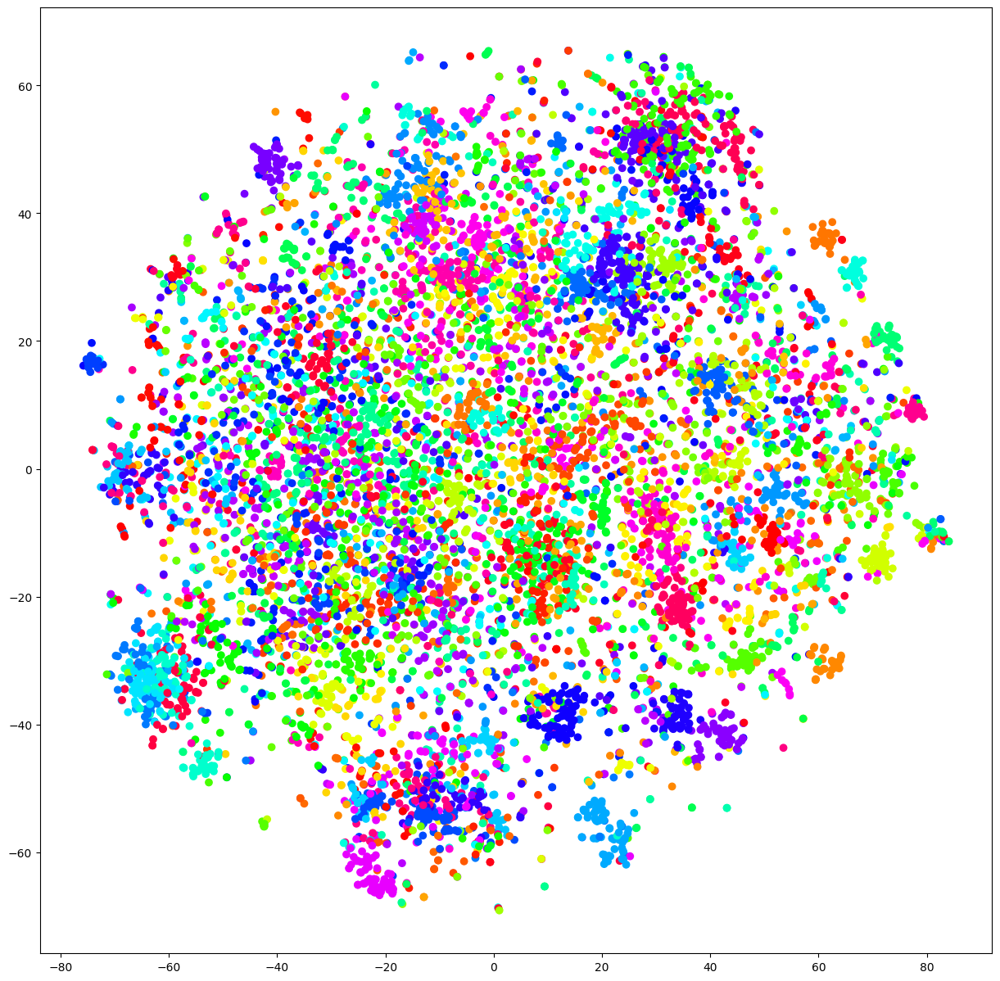

In [82]:
plot_representations(output_tsne_data, labels[:1000], classes)

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


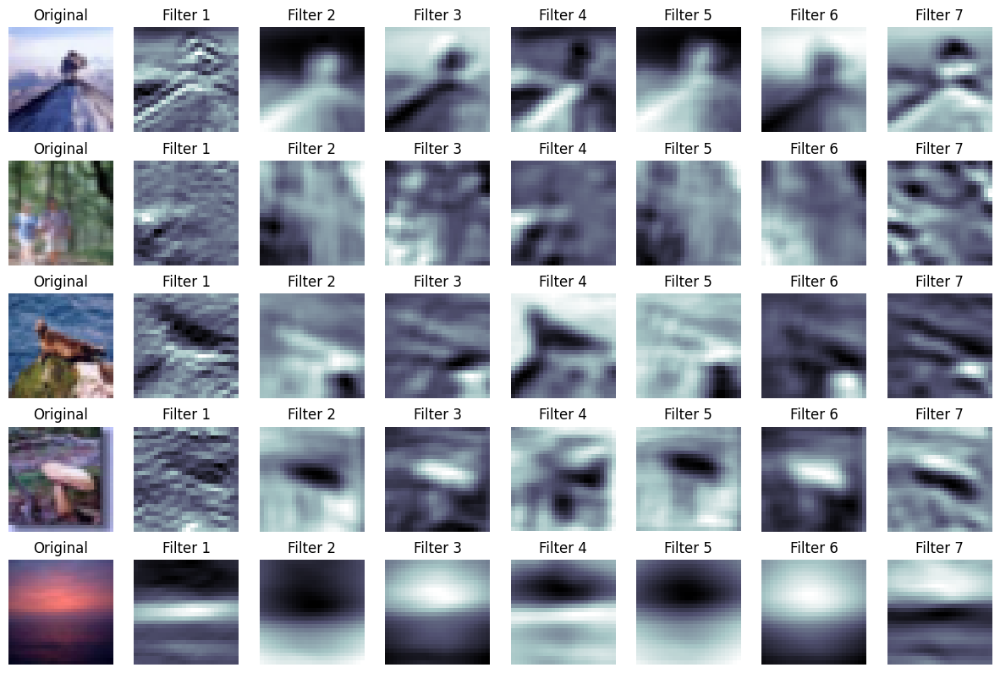

In [76]:
batch = next(iter(testloader))
n_images = 5
images = batch[0][:n_images, ...].cuda()

n_filters = 7
filters = net.conv1.weight.data
filters = filters[:n_filters]

filtered_images = F.conv2d(images, filters)

fig = plt.figure(figsize = (15, 15))

for i in range(n_images):

    image = images[i]

    image = normalize_image(image)

    ax = fig.add_subplot(n_images, n_filters+1, i+1+(i*n_filters))
    ax.imshow(image.permute(1, 2, 0).cpu().numpy())
    ax.set_title('Original')
    ax.axis('off')

    for j in range(n_filters):
        image = filtered_images[i][j]

        image = normalize_image(image)

        ax = fig.add_subplot(n_images, n_filters+1, i+1+(i*n_filters)+j+1)
        ax.imshow(image.cpu().numpy(), cmap = 'bone')
        ax.set_title(f'Filter {j+1}')
        ax.axis('off');

fig.subplots_adjust(hspace = -0.7)

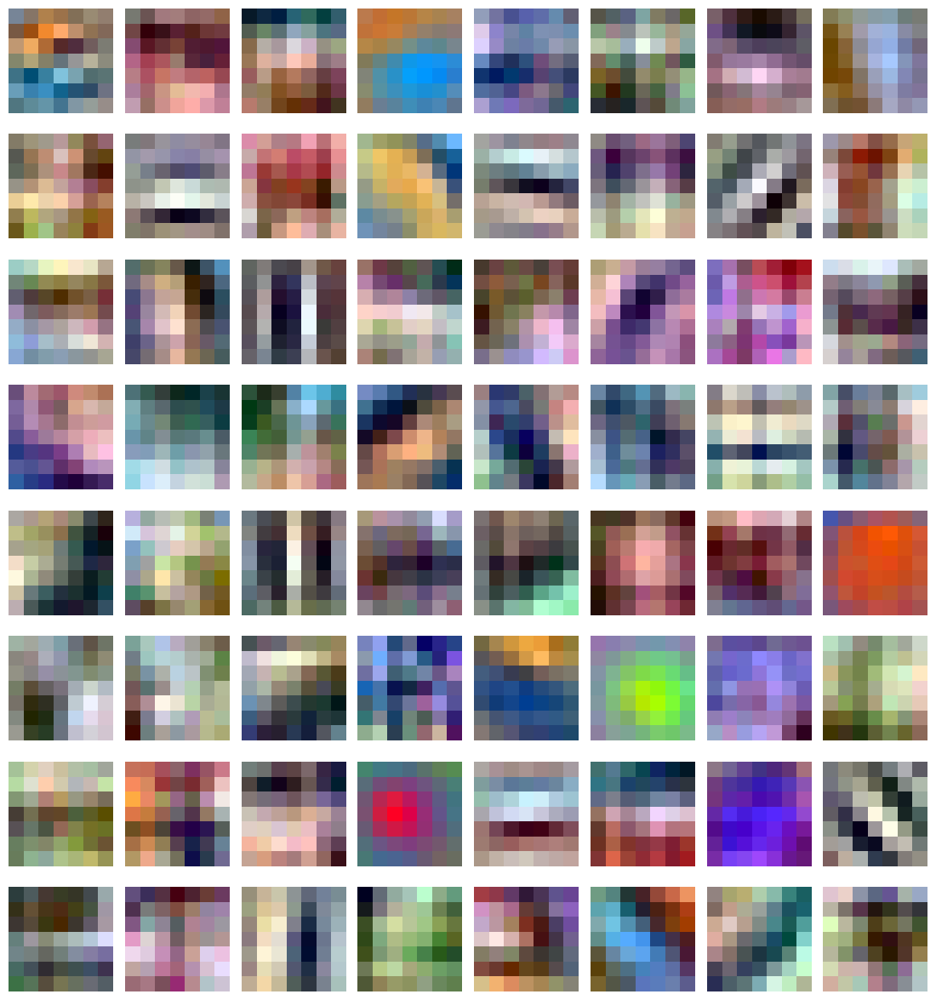

In [77]:
filters = net.conv1.weight.data
filters = filters.cpu()

n_filters = filters.shape[0]

rows = int(np.sqrt(n_filters))
cols = int(np.sqrt(n_filters))

fig = plt.figure(figsize = (30, 15))

for i in range(rows*cols):

    image = filters[i]

    image = normalize_image(image)

    ax = fig.add_subplot(rows, cols, i+1)
    ax.imshow(image.permute(1, 2, 0))
    ax.axis('off')

fig.subplots_adjust(wspace=-0.9)